In [1]:
import pandas as pd
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tqdm import tqdm_notebook
%matplotlib inline

In [2]:
import tensorflow
print (tensorflow.__version__)

2.3.0


In [3]:
from google.colab import drive

drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [4]:
!unzip /content/gdrive/MyDrive/GAN_datasets/celeb_faces.zip -d /content/

Streaming output truncated to the last 5000 lines.
  inflating: /content/100k/100k/192419.jpg  
  inflating: /content/100k/100k/192420.jpg  
  inflating: /content/100k/100k/192422.jpg  
  inflating: /content/100k/100k/192424.jpg  
  inflating: /content/100k/100k/192428.jpg  
  inflating: /content/100k/100k/192429.jpg  
  inflating: /content/100k/100k/192430.jpg  
  inflating: /content/100k/100k/192435.jpg  
  inflating: /content/100k/100k/192437.jpg  
  inflating: /content/100k/100k/192438.jpg  
  inflating: /content/100k/100k/192440.jpg  
  inflating: /content/100k/100k/192442.jpg  
  inflating: /content/100k/100k/192444.jpg  
  inflating: /content/100k/100k/192445.jpg  
  inflating: /content/100k/100k/192447.jpg  
  inflating: /content/100k/100k/192448.jpg  
  inflating: /content/100k/100k/192450.jpg  
  inflating: /content/100k/100k/192456.jpg  
  inflating: /content/100k/100k/192457.jpg  
  inflating: /content/100k/100k/192460.jpg  
  inflating: /content/100k/100k/192465.jpg  
  in

In [4]:
import glob
files = glob.glob('/content/100k/100k/*.jpg')
len(files)

100000

In [5]:
for file in files[:10]:
    anime_img = cv2.imread(file)
    print (anime_img.shape)

(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)


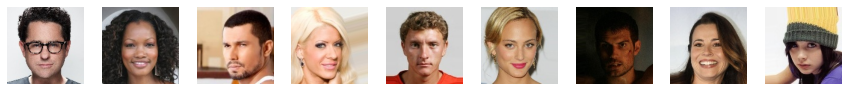

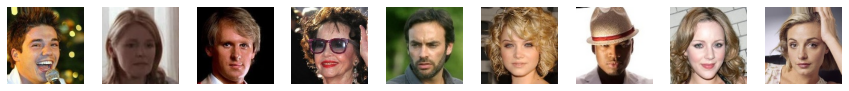

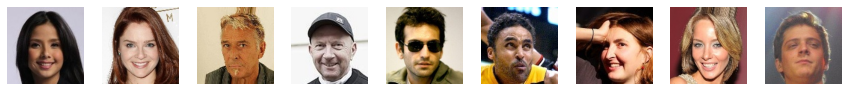

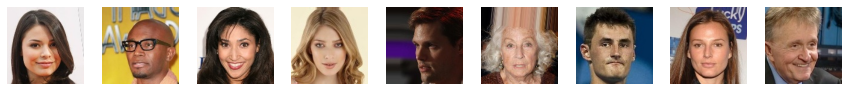

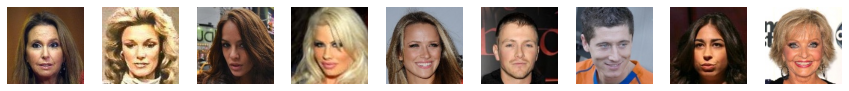

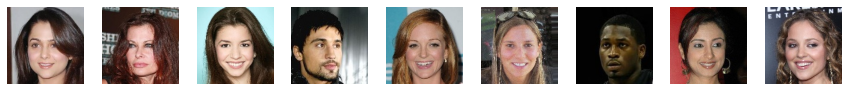

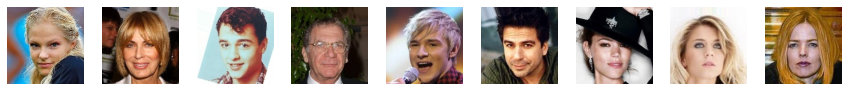

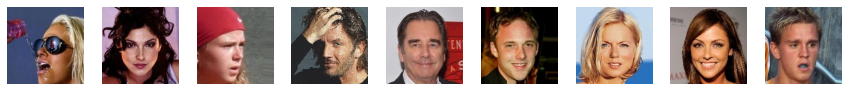

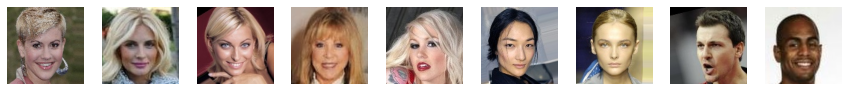

In [6]:
for k in range(9):
    plt.figure(figsize=(15, 15))
    for j in range(9):
        f = np.random.choice(files)
        celeb_img = cv2.imread(f)
        celeb_img = cv2.cvtColor(celeb_img, cv2.COLOR_BGR2RGB)
        plt.subplot(990 + 1 + j)
        plt.imshow(celeb_img)
        plt.axis('off')
        #plt.title(trainY[i])
    plt.show()

In [ ]:
from tqdm import tqdm_notebook

images = []
for file in tqdm_notebook(files):
    celeb_img = cv2.imread(file)
    celeb_img = cv2.cvtColor(celeb_img, cv2.COLOR_BGR2RGB)
    celeb_img = cv2.resize(celeb_img, (100, 100))
    images.append((celeb_img-127.5)/127.5)

images = np.array(images)
print (images.shape)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  after removing the cwd from sys.path.


# Generator Model

In [7]:
random_input = tensorflow.keras.layers.Input(shape = 100)

x = tensorflow.keras.layers.Dense(64 * 7 * 7)(random_input)
x = tensorflow.keras.layers.Activation('relu')(x)
x = tensorflow.keras.layers.BatchNormalization(momentum=0.8)(x)

x = tensorflow.keras.layers.Reshape((7, 7, 64))(x)

x = tensorflow.keras.layers.Conv2DTranspose(filters=128, kernel_size=(5,5), strides=(2,2), padding='same')(x)
x = tensorflow.keras.layers.Activation('relu')(x)
x = tensorflow.keras.layers.BatchNormalization(momentum=0.8)(x)

x = tensorflow.keras.layers.Conv2DTranspose(filters=128, kernel_size=(5,5), strides=(2,2), padding='same')(x)
x = tensorflow.keras.layers.Activation('relu')(x)
x = tensorflow.keras.layers.BatchNormalization(momentum=0.8)(x)

x = tensorflow.keras.layers.Conv2DTranspose(filters=128, kernel_size=(5,5), strides=(2,2), padding='same')(x)
x = tensorflow.keras.layers.Activation('relu')(x)
x = tensorflow.keras.layers.BatchNormalization(momentum=0.8)(x)

x = tensorflow.keras.layers.Conv2DTranspose(filters=128, kernel_size=(5,5), padding='same')(x)
x = tensorflow.keras.layers.Activation('relu')(x)

x = tensorflow.keras.layers.Conv2D(filters=3, kernel_size=(3,3), padding='same')(x)
generated_image = tensorflow.keras.layers.Activation('tanh')(x)

generator_network = tensorflow.keras.models.Model(inputs=random_input, outputs=generated_image)
generator_network.summary()

Model: "functional_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 100)]             0         
_________________________________________________________________
dense (Dense)                (None, 3136)              316736    
_________________________________________________________________
activation (Activation)      (None, 3136)              0         
_________________________________________________________________
batch_normalization (BatchNo (None, 3136)              12544     
_________________________________________________________________
reshape (Reshape)            (None, 7, 7, 64)          0         
_________________________________________________________________
conv2d_transpose (Conv2DTran (None, 14, 14, 128)       204928    
_________________________________________________________________
activation_1 (Activation)    (None, 14, 14, 128)      

# Discriminator

In [8]:
image_input = tensorflow.keras.layers.Input(shape=(56, 56, 3))

x = tensorflow.keras.layers.Conv2D(filters=128, kernel_size=(5,5), strides=2, padding='same')(image_input)
x = tensorflow.keras.layers.LeakyReLU(alpha=0.2)(x)

x = tensorflow.keras.layers.Conv2D(filters=64, kernel_size=(5,5), strides=2, padding='same')(x)
x = tensorflow.keras.layers.LeakyReLU(alpha=0.2)(x)
x = tensorflow.keras.layers.BatchNormalization(momentum=0.8)(x)

x = tensorflow.keras.layers.Conv2D(filters=128, kernel_size=(5,5), strides=2, padding='same')(x)
x = tensorflow.keras.layers.LeakyReLU(alpha=0.2)(x)
x = tensorflow.keras.layers.BatchNormalization(momentum=0.8)(x)

x = tensorflow.keras.layers.Conv2D(filters=64, kernel_size=(5,5), padding='same')(x)
x = tensorflow.keras.layers.LeakyReLU(alpha=0.2)(x)
x = tensorflow.keras.layers.BatchNormalization(momentum=0.8)(x)

x = tensorflow.keras.layers.Conv2D(filters=128, kernel_size=(5,5))(x)
x = tensorflow.keras.layers.LeakyReLU(alpha=0.2)(x)
x = tensorflow.keras.layers.BatchNormalization(momentum=0.8)(x)

x = tensorflow.keras.layers.Conv2D(filters=64, kernel_size=(3,3))(x)
x = tensorflow.keras.layers.LeakyReLU(alpha=0.2)(x)
x = tensorflow.keras.layers.BatchNormalization(momentum=0.8)(x)

x = tensorflow.keras.layers.Flatten()(x)

x = tensorflow.keras.layers.Dense(1)(x)
real_vs_fake_output = tensorflow.keras.layers.Activation('sigmoid')(x)

discriminator_network = tensorflow.keras.models.Model(inputs=image_input, outputs=real_vs_fake_output)
discriminator_network.summary()

Model: "functional_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 56, 56, 3)]       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 28, 28, 128)       9728      
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 28, 28, 128)       0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 14, 14, 64)        204864    
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 14, 14, 64)        0         
_________________________________________________________________
batch_normalization_4 (Batch (None, 14, 14, 64)        256       
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 7, 7, 128)        

In [9]:
adam_optimizer = tensorflow.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5)
discriminator_network.compile(loss='binary_crossentropy', optimizer=adam_optimizer, metrics=['accuracy'])

# DC GAN

In [10]:
discriminator_network.trainable=False

g_output = generator_network(random_input)
d_output = discriminator_network(g_output)

dcgan_model = tensorflow.keras.models.Model(random_input, d_output)
dcgan_model.summary()

Model: "functional_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 100)]             0         
_________________________________________________________________
functional_1 (Functional)    (None, 56, 56, 3)         1768387   
_________________________________________________________________
functional_3 (Functional)    (None, 1)                 904961    
Total params: 2,673,348
Trainable params: 1,761,347
Non-trainable params: 912,001
_________________________________________________________________


# Compiling Models

In [11]:
dcgan_model.compile(loss='binary_crossentropy', optimizer=adam_optimizer)

# Define Data Generators

In [4]:
def get_random_noise(batch_size, noise_size):
    random_values = np.random.randn(batch_size*noise_size)
    random_noise_batch = np.reshape(random_values, (batch_size, noise_size))
    return random_noise_batch

def get_fake_samples(generator_network, batch_size, noise_size):
    random_noise_batch = get_random_noise(batch_size, noise_size) 
    fake_samples = generator_network.predict_on_batch(random_noise_batch)
    return fake_samples

def get_real_samples(batch_size):
    random_files = np.random.choice(files, size=batch_size)
    images = []
    for file in random_files:
        celeb_img = cv2.imread(file)
        celeb_img = cv2.cvtColor(celeb_img, cv2.COLOR_BGR2RGB)
        celeb_img = cv2.resize(celeb_img, (56, 56))
        images.append((celeb_img-127.5)/127.5)
    real_images = np.array(images)
    return real_images

def show_generator_results(generator_network):
    for k in range(9):
        plt.figure(figsize=(11, 11))
        fake_samples = get_fake_samples(generator_network, 9, noise_size)
        fake_samples = (fake_samples+1.0)/2.0
        for j in range(9):
            plt.subplot(990 + 1 + j)
            plt.imshow(fake_samples[j])
            plt.axis('off')
            #plt.title(trainY[i])
        plt.show()
    return

# Training GAN

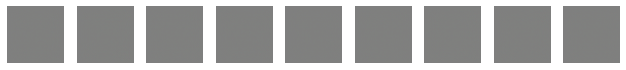

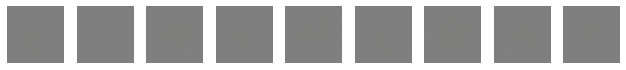

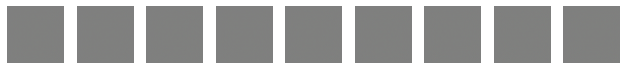

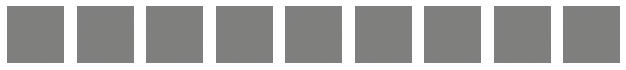

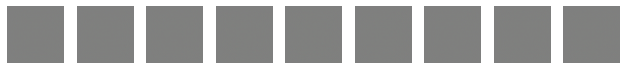

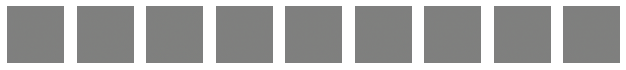

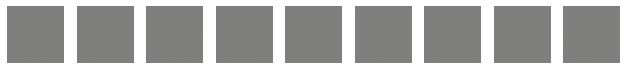

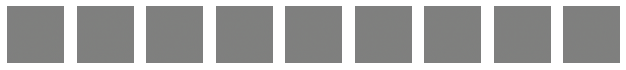

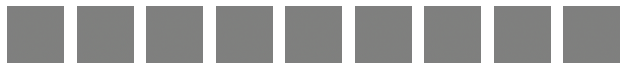

Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/GAN_datasets/celeb_model_0/assets
Epoch:0, Step:0, D-Loss:1.143, D-Acc:20.000, G-Loss:0.665
Epoch:0, Step:50, D-Loss:0.044, D-Acc:99.000, G-Loss:10.416
Epoch:0, Step:100, D-Loss:0.279, D-Acc:87.000, G-Loss:3.813
Epoch:0, Step:150, D-Loss:0.248, D-Acc:90.000, G-Loss:4.373
Epoch:0, Step:200, D-Loss:0.120, D-Acc:96.000, G-Loss:4.974
Epoch:0, Step:250, D-Loss:0.297, D-Acc:92.000, G-Loss:2.804
Epoch:0, Step:300, D-Loss:0.172, D-Acc:92.000, G-Loss:8.522
Epoch:0, Step:350, D-Loss:0.191, D-Acc:91.000, G-Loss:2.756
Epoch:0, Step:400, D-Loss:0.634, D-Acc:72.000, G-Loss:5.606
Epoch:0, Step:450, D-Loss:0.200, D-Acc:93.000, G-Loss:1.924
Epoch:1, Step:0, D-Loss:0.192, D-Acc:93.000, G-Loss:3.997
Epoch:1, Step:50,

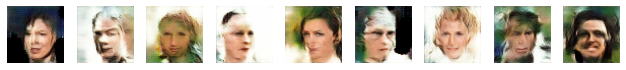

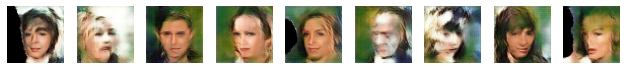

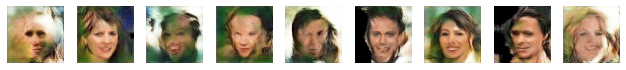

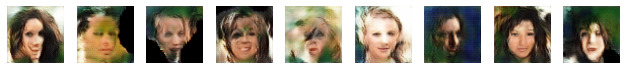

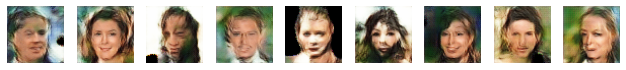

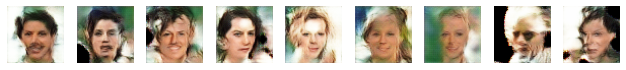

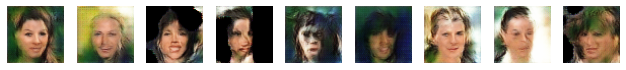

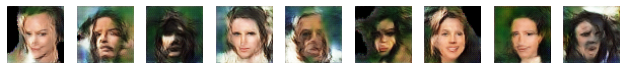

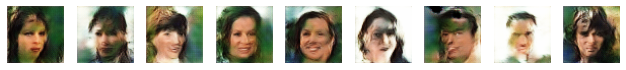

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/GAN_datasets/celeb_model_5/assets
Epoch:5, Step:0, D-Loss:0.461, D-Acc:74.000, G-Loss:3.255
Epoch:5, Step:50, D-Loss:0.349, D-Acc:86.000, G-Loss:2.904
Epoch:5, Step:100, D-Loss:0.567, D-Acc:72.000, G-Loss:1.332
Epoch:5, Step:150, D-Loss:0.088, D-Acc:98.000, G-Loss:3.154
Epoch:5, Step:200, D-Loss:0.074, D-Acc:98.000, G-Loss:3.424
Epoch:5, Step:250, D-Loss:0.606, D-Acc:76.000, G-Loss:4.144
Epoch:5, Step:300, D-Loss:0.028, D-Acc:99.000, G-Loss:4.337
Epoch:5, Step:350, D-Loss:0.336, D-Acc:84.000, G-Loss:1.913
Epoch:5, Step:400, D-Loss:0.482, D-Acc:79.000, G-Loss:2.123
Epoch:5, Step:450, D-Loss:0.202, D-Acc:96.000, G-Loss:2.963
Epoch:6, Step:0, D-Loss:0.542, D-Acc:73.000, G-Loss:2.159
Epoch:6, Step:50, D-Loss:0.450, D-Acc:77.000, G-Loss:0.506
Epoch:6, Step:100, D-Loss:0.443, D-Acc:79.000, G-Loss:1.563
Epoch:6, Step:150, D-Loss:0.375, D-Acc:82.000, G-Loss:1.680
Epoch:6, Step:200, D-Loss:0.155, D-Acc:93.000, G-Loss:2.693
Epoch:6, Step

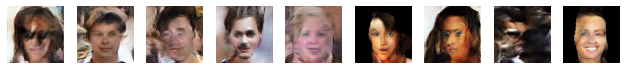

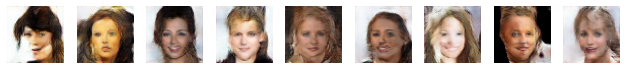

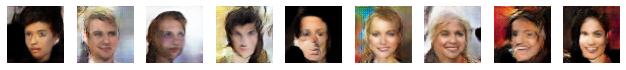

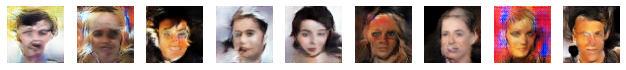

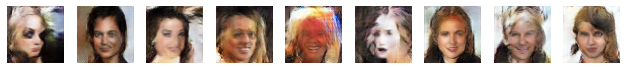

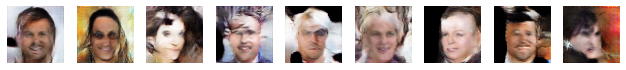

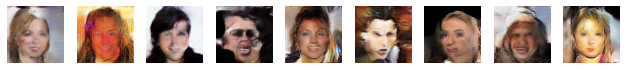

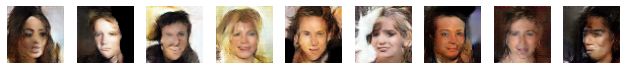

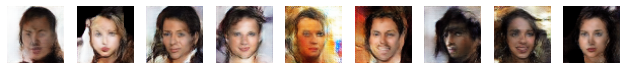

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/GAN_datasets/celeb_model_10/assets
Epoch:10, Step:0, D-Loss:0.539, D-Acc:69.000, G-Loss:1.096
Epoch:10, Step:50, D-Loss:0.617, D-Acc:66.000, G-Loss:0.820
Epoch:10, Step:100, D-Loss:0.463, D-Acc:82.000, G-Loss:0.918
Epoch:10, Step:150, D-Loss:0.636, D-Acc:73.000, G-Loss:1.136
Epoch:10, Step:200, D-Loss:0.500, D-Acc:79.000, G-Loss:1.129
Epoch:10, Step:250, D-Loss:0.533, D-Acc:71.000, G-Loss:1.279
Epoch:10, Step:300, D-Loss:0.620, D-Acc:66.000, G-Loss:0.682
Epoch:10, Step:350, D-Loss:0.521, D-Acc:76.000, G-Loss:1.212
Epoch:10, Step:400, D-Loss:0.621, D-Acc:68.000, G-Loss:0.913
Epoch:10, Step:450, D-Loss:0.606, D-Acc:70.000, G-Loss:0.908
Epoch:11, Step:0, D-Loss:0.753, D-Acc:54.000, G-Loss:0.595
Epoch:11, Step:50, D-Loss:0.491, D-Acc:77.000, G-Loss:0.880
Epoch:11, Step:100, D-Loss:0.552, D-Acc:73.000, G-Loss:1.346
Epoch:11, Step:150, D-Loss:0.534, D-Acc:74.000, G-Loss:1.432
Epoch:11, Step:200, D-Loss:0.621, D-Acc:61.000, G-Loss:0.7

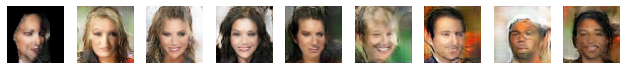

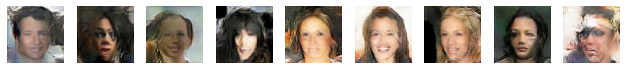

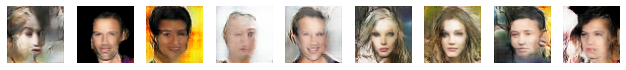

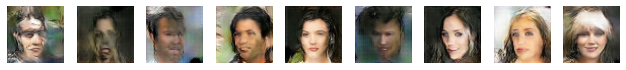

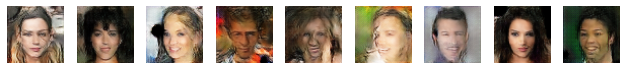

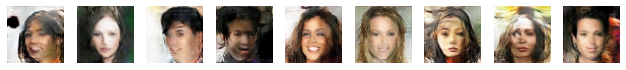

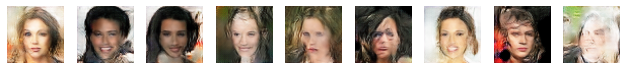

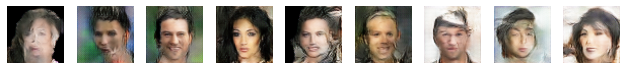

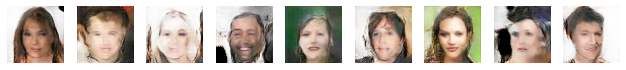

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/GAN_datasets/celeb_model_15/assets
Epoch:15, Step:0, D-Loss:0.610, D-Acc:68.000, G-Loss:1.177
Epoch:15, Step:50, D-Loss:0.709, D-Acc:57.000, G-Loss:0.773
Epoch:15, Step:100, D-Loss:0.654, D-Acc:65.000, G-Loss:0.727
Epoch:15, Step:150, D-Loss:0.703, D-Acc:65.000, G-Loss:0.786
Epoch:15, Step:200, D-Loss:0.628, D-Acc:59.000, G-Loss:1.416
Epoch:15, Step:250, D-Loss:0.596, D-Acc:69.000, G-Loss:0.594
Epoch:15, Step:300, D-Loss:0.494, D-Acc:77.000, G-Loss:1.337
Epoch:15, Step:350, D-Loss:0.661, D-Acc:67.000, G-Loss:1.262
Epoch:15, Step:400, D-Loss:0.692, D-Acc:59.000, G-Loss:0.850
Epoch:15, Step:450, D-Loss:0.625, D-Acc:65.000, G-Loss:1.039
Epoch:16, Step:0, D-Loss:0.521, D-Acc:81.000, G-Loss:1.129
Epoch:16, Step:50, D-Loss:0.823, D-Acc:46.000, G-Loss:0.892
Epoch:16, Step:100, D-Loss:0.558, D-Acc:68.000, G-Loss:1.069
Epoch:16, Step:150, D-Loss:0.643, D-Acc:68.000, G-Loss:1.915
Epoch:16, Step:200, D-Loss:0.680, D-Acc:51.000, G-Loss:0.8

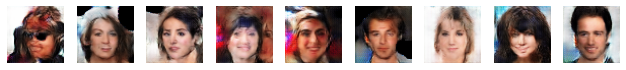

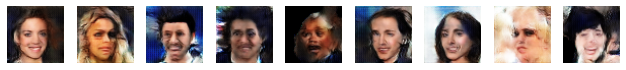

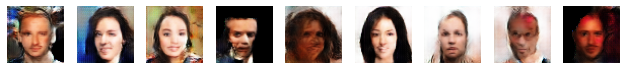

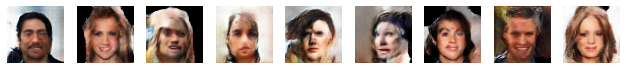

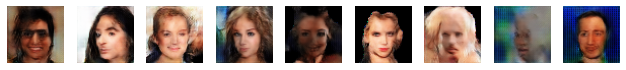

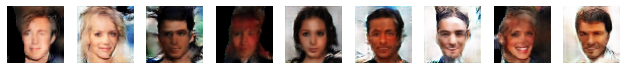

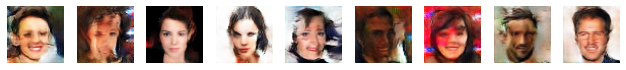

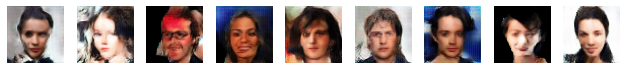

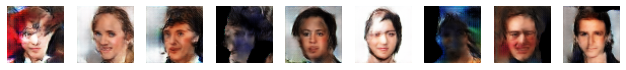

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/GAN_datasets/celeb_model_20/assets
Epoch:20, Step:0, D-Loss:0.596, D-Acc:68.000, G-Loss:0.946
Epoch:20, Step:50, D-Loss:0.561, D-Acc:77.000, G-Loss:1.298
Epoch:20, Step:100, D-Loss:0.706, D-Acc:56.000, G-Loss:0.700
Epoch:20, Step:150, D-Loss:0.743, D-Acc:47.000, G-Loss:0.631
Epoch:20, Step:200, D-Loss:0.578, D-Acc:66.000, G-Loss:1.373
Epoch:20, Step:250, D-Loss:0.527, D-Acc:79.000, G-Loss:0.840
Epoch:20, Step:300, D-Loss:0.693, D-Acc:66.000, G-Loss:1.400
Epoch:20, Step:350, D-Loss:0.657, D-Acc:59.000, G-Loss:0.776
Epoch:20, Step:400, D-Loss:0.786, D-Acc:38.000, G-Loss:0.726
Epoch:20, Step:450, D-Loss:0.716, D-Acc:48.000, G-Loss:0.835
Epoch:21, Step:0, D-Loss:0.520, D-Acc:74.000, G-Loss:1.880
Epoch:21, Step:50, D-Loss:0.676, D-Acc:58.000, G-Loss:0.698
Epoch:21, Step:100, D-Loss:0.577, D-Acc:76.000, G-Loss:1.082
Epoch:21, Step:150, D-Loss:0.747, D-Acc:53.000, G-Loss:0.390
Epoch:21, Step:200, D-Loss:0.772, D-Acc:43.000, G-Loss:0.6

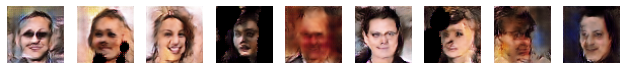

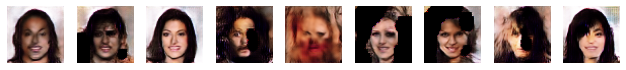

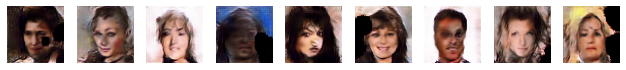

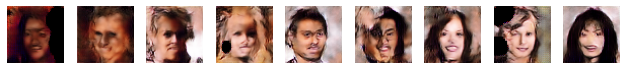

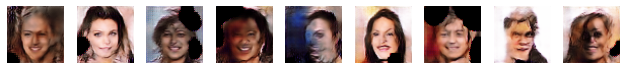

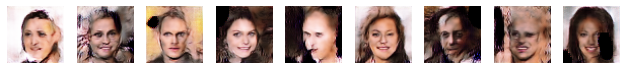

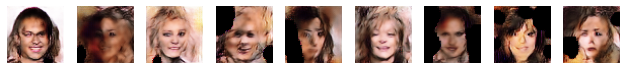

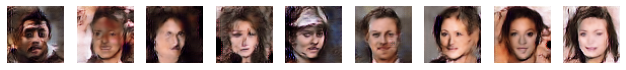

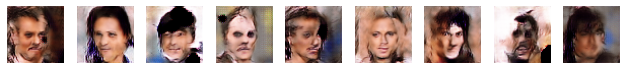

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/GAN_datasets/celeb_model_25/assets
Epoch:25, Step:0, D-Loss:0.545, D-Acc:73.000, G-Loss:0.713
Epoch:25, Step:50, D-Loss:0.822, D-Acc:42.000, G-Loss:0.376
Epoch:25, Step:100, D-Loss:0.579, D-Acc:71.000, G-Loss:0.262
Epoch:25, Step:150, D-Loss:0.573, D-Acc:76.000, G-Loss:0.894
Epoch:25, Step:200, D-Loss:0.611, D-Acc:70.000, G-Loss:0.908
Epoch:25, Step:250, D-Loss:0.613, D-Acc:76.000, G-Loss:0.912
Epoch:25, Step:300, D-Loss:0.604, D-Acc:68.000, G-Loss:0.953
Epoch:25, Step:350, D-Loss:0.576, D-Acc:69.000, G-Loss:0.353
Epoch:25, Step:400, D-Loss:0.654, D-Acc:64.000, G-Loss:0.598
Epoch:25, Step:450, D-Loss:0.695, D-Acc:51.000, G-Loss:0.414
Epoch:26, Step:0, D-Loss:0.807, D-Acc:43.000, G-Loss:0.538
Epoch:26, Step:50, D-Loss:0.616, D-Acc:70.000, G-Loss:0.745
Epoch:26, Step:100, D-Loss:0.536, D-Acc:78.000, G-Loss:1.023
Epoch:26, Step:150, D-Loss:0.647, D-Acc:69.000, G-Loss:0.382
Epoch:26, Step:200, D-Loss:0.628, D-Acc:66.000, G-Loss:0.7

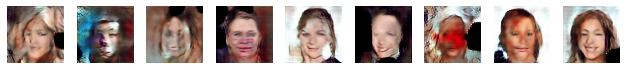

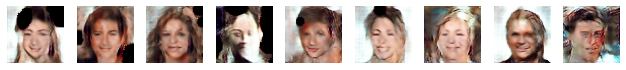

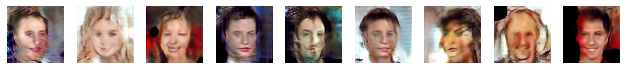

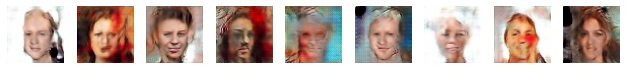

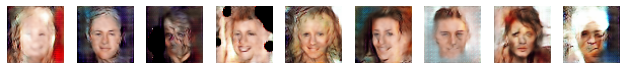

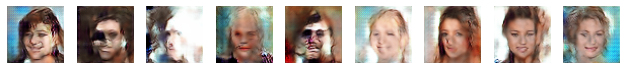

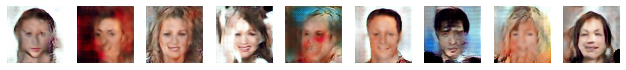

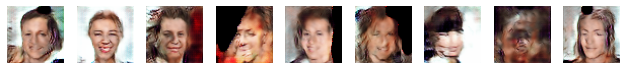

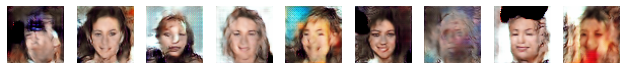

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/GAN_datasets/celeb_model_30/assets
Epoch:30, Step:0, D-Loss:0.618, D-Acc:71.000, G-Loss:0.878
Epoch:30, Step:50, D-Loss:0.667, D-Acc:59.000, G-Loss:0.658
Epoch:30, Step:100, D-Loss:0.670, D-Acc:60.000, G-Loss:0.767
Epoch:30, Step:150, D-Loss:0.640, D-Acc:64.000, G-Loss:0.694
Epoch:30, Step:200, D-Loss:0.633, D-Acc:63.000, G-Loss:1.119
Epoch:30, Step:250, D-Loss:0.657, D-Acc:61.000, G-Loss:0.909
Epoch:30, Step:300, D-Loss:0.725, D-Acc:53.000, G-Loss:0.621
Epoch:30, Step:350, D-Loss:0.725, D-Acc:42.000, G-Loss:0.629
Epoch:30, Step:400, D-Loss:0.674, D-Acc:56.000, G-Loss:0.765
Epoch:30, Step:450, D-Loss:0.711, D-Acc:49.000, G-Loss:0.607
Epoch:31, Step:0, D-Loss:0.548, D-Acc:73.000, G-Loss:0.943
Epoch:31, Step:50, D-Loss:0.684, D-Acc:59.000, G-Loss:1.653
Epoch:31, Step:100, D-Loss:0.686, D-Acc:57.000, G-Loss:0.538
Epoch:31, Step:150, D-Loss:0.686, D-Acc:58.000, G-Loss:0.983
Epoch:31, Step:200, D-Loss:0.740, D-Acc:48.000, G-Loss:0.6

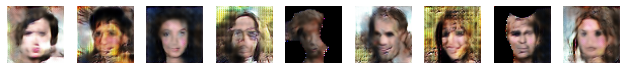

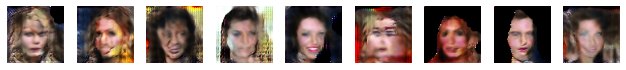

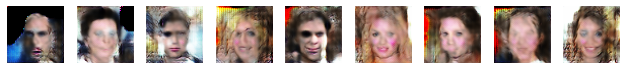

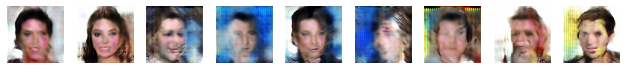

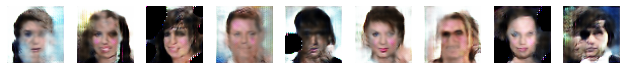

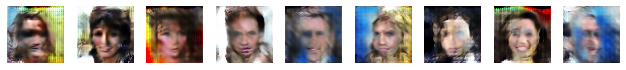

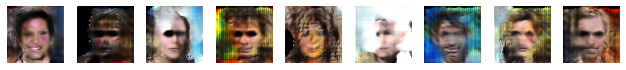

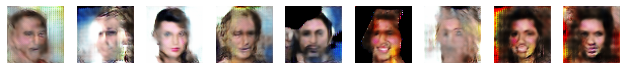

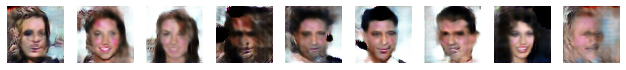

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/GAN_datasets/celeb_model_35/assets
Epoch:35, Step:0, D-Loss:0.603, D-Acc:68.000, G-Loss:0.573
Epoch:35, Step:50, D-Loss:0.367, D-Acc:82.000, G-Loss:0.186
Epoch:35, Step:100, D-Loss:0.556, D-Acc:79.000, G-Loss:0.570
Epoch:35, Step:150, D-Loss:0.585, D-Acc:77.000, G-Loss:1.229
Epoch:35, Step:200, D-Loss:0.593, D-Acc:70.000, G-Loss:2.093
Epoch:35, Step:250, D-Loss:0.595, D-Acc:64.000, G-Loss:0.545
Epoch:35, Step:300, D-Loss:0.556, D-Acc:72.000, G-Loss:1.106
Epoch:35, Step:350, D-Loss:0.469, D-Acc:79.000, G-Loss:0.215
Epoch:35, Step:400, D-Loss:0.656, D-Acc:62.000, G-Loss:1.156
Epoch:35, Step:450, D-Loss:0.723, D-Acc:58.000, G-Loss:0.310
Epoch:36, Step:0, D-Loss:0.663, D-Acc:58.000, G-Loss:0.460
Epoch:36, Step:50, D-Loss:0.279, D-Acc:98.000, G-Loss:1.199
Epoch:36, Step:100, D-Loss:0.624, D-Acc:70.000, G-Loss:0.537
Epoch:36, Step:150, D-Loss:0.644, D-Acc:63.000, G-Loss:0.223
Epoch:36, Step:200, D-Loss:0.487, D-Acc:84.000, G-Loss:0.1

KeyboardInterrupt: ignored

In [13]:
epochs = 200
batch_size = 100
steps = 500
noise_size = 100

for i in range(0, epochs):
    if (i%5 == 0):
        show_generator_results(generator_network)
        generator_network.save('/content/gdrive/MyDrive/GAN_datasets/celeb_model_'+ str(i))
    for j in range(steps):
        fake_samples = get_fake_samples(generator_network, batch_size//2, noise_size)
        real_samples = get_real_samples(batch_size=batch_size//2)

        fake_y = np.zeros((batch_size//2, 1))
        real_y = np.ones((batch_size//2, 1))
        
        input_batch = np.vstack((fake_samples, real_samples))
        output_labels = np.vstack((fake_y, real_y))
        # Updating Discriminator weights
        discriminator_network.trainable=True
        loss_d = discriminator_network.train_on_batch(input_batch, output_labels)
        
        gan_input = get_random_noise(batch_size, noise_size)
        
        # Make the Discriminator belive that these are real samples and calculate loss to train the generator
        gan_output = np.ones((batch_size))
        
        # Updating Generator weights
        discriminator_network.trainable=False
        loss_g = dcgan_model.train_on_batch(gan_input, gan_output)
        
        if j%50 == 0:
            print ("Epoch:%.0f, Step:%.0f, D-Loss:%.3f, D-Acc:%.3f, G-Loss:%.3f"%(i,j,loss_d[0],loss_d[1]*100,loss_g))
            

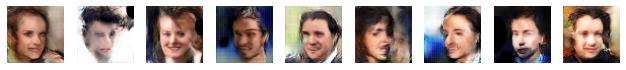

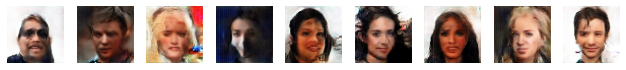

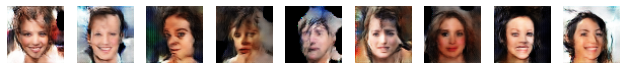

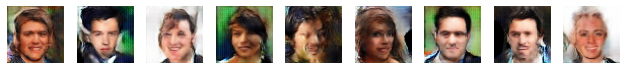

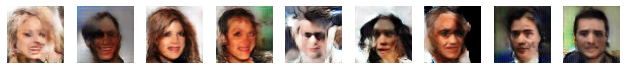

...

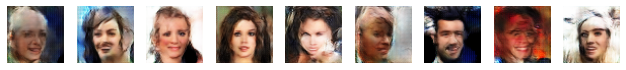

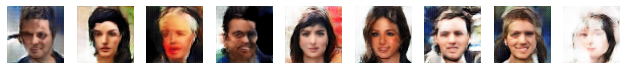

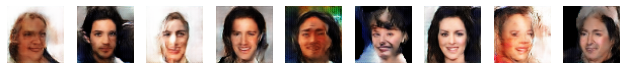

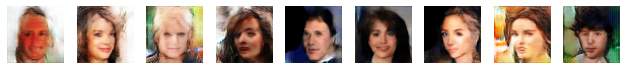

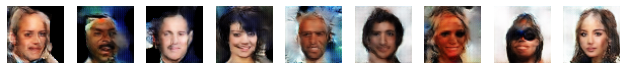

In [8]:
#Generating Unlimited samples
noise_size=100
generator_network = tensorflow.keras.models.load_model('/content/gdrive/MyDrive/GAN_datasets/celeb_model_new')
for i in range(5):
    show_generator_results(generator_network)